# Explainer Notebook for UT Austin Employee Project

## Work distribution

* Motivation:  s175396: 0%, s165533: 100%, s183989: 0%
* Basic stats: s175396: 25%, s165533: 25%, s183989: 50%
* Data Analysis: s175396: 33%, s165533: 33%, s183989: 33%
* Genre:  s175396: 0%, s165533: 100%, s183989: 0%
* Visualization: s175396: 0%, s165533: 100%, s183989: 0%
* Discussion: s175396: 33%, s165533: 33%, s183989: 33%
* Website: s175396: 50%, s165533: 0%, s183989: 50%

## Motivation 

__Data set intro__

> The data set consist of around 14008 observations with information about the employees of the university of Texas at Austin, collected in 2018, and can be found [here](https://www.kaggle.com/datasets/bcheong/ut-austin-employee-salaries-and-home-locations). The data set contains 11 variables: anonymous_key, job, department, salary, latitude and longitude of adress, hire_date, race, gender, job type (full time/part time)and address. Only 10 of these are interesting to further work with, as 'anonymous_key' does not hold any information except an index. 


__Data set motivation__
> We wanted to find a data set where we could investigate whether there were any discrimination or inequalities between the ethnicities or gender. This is related to goal 10 of the SDG's which focus on reducing inequalities. This data set allows us to analyse if there is a difference between salary when looking at gender and ethnicities. Furthermore gives the geographical information us a chance to explore the distribution of people with different salaries.

__Goal for end user experience__
> Our goal is that the end user's can explore our website which we wish to be user friendly so that everyone with or without knowledge of the topic in advance, will be able to familiarize themselves with the topic and through the visualizations, statistics and the text provided get a view into whether there is inequality between gender and ethnicities. 

__OBS!__ Some further analysis and plots were made in R. The R-code can be found [on Github](https://github.com/johannefalk/utaustinemployeeproject/)

# Basic stats
## Preprocessing

We import the data and do the necessary preprocessing. 

In [1]:
#imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats
from datetime import datetime
import folium
from folium import plugins
from folium.plugins import HeatMap

#if necessary,install geopy
#!pip install geopy

In [2]:
#read data
raw_data = pd.read_csv("utaustin_locations_jobs.csv")

In [3]:
#check for nan values
raw_data.isna().values.any()
#remove nans but not in latitude, longeitude and adresse, since there are missing latitude and longeitude 
# for around 4000 observations.
data = raw_data.copy()
data = data[['job', 'dept', 'salary', 'hire_date', 'race', 'gender', 'type']]
data = data.dropna()

In [4]:
#remove white space
data["job"] = data["job"].str.strip()
data["dept"] = data["dept"].str.strip()
data["race"] = data["race"].str.strip()
data["gender"] = data["gender"].str.strip()
data["type"] = data["type"].str.strip()

In [5]:
#remove small race categories
race2keep = data["race"].unique()[0:6]
data = data.loc[data["race"].isin(race2keep)]

In [6]:
#change time format to date time
data[['str_date']] = data[['hire_date']].applymap(str).applymap(lambda s: "{}/{}/{}".format(s[6:], s[4:6], s[0:4])) #to string

data["date_time"] = " "
for i in data.index:
    x = datetime.strptime(data['str_date'][i], '%d/%m/%Y') #to date time
    data["date_time"][i] = x


C:\Users\johan\AppData\Local\Temp/ipykernel_51536/3903694157.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["date_time"][i] = x


In [7]:
#get year and month
data['year_hire'] = pd.DatetimeIndex(data['date_time']).year
data['month'] = pd.DatetimeIndex(data['date_time']).month_name()
data['year_emp'] = 2018 - data['year_hire']

In [8]:
#remove person hired in 1919
indx = np.argmin(data['year_hire'])
indx_2 = data.index[indx]
data.loc[indx_2,:];

np.argmin(data['year_hire'])
data.drop(data.index[6038], axis=0, inplace=True)

In [9]:
#color definition 
color_gender = ["green", "deeppink"]
color_race = ["gold", "aqua","olive","tomato","slategray","blueviolet"]

In [10]:
#order definition 
order_gender = ["MALE", "FEMALE"]
order_race = sorted(race2keep)


__Comments on data and preprocessing__
>The address along with latitude and longitude is information originally found from publicly available data. However, not all the employees' addresses have been on public record. This leads to around 4000 observations without coordinates. Instead of removing all of these observations from the data set, we work with two data set for the analysis: _data_ for all of the standard analysis (containing almost 14000 observations, when nans are removed) and _geo_data_ for investigating geographical data. In _geo_data_ we furthermore only look at addresses in Texas. From both the data sets is observations with missing information removed. We also remove the ethnicity 'NATIVE HAWAIIAN/PACIFIC ISLANDER' (5 observations) and 3 blank race observations.

> From the variable hiring_date we create three new variables: *month, year* and *employed time* indicating how long an individual has been imployed.

> We found that one employee had been employed for 99 years (supposed to be hired in 1919). This seems like an awful (and unrealistic) long time to be employed, and to avoid this outlier, we remove the observation. 

## Basic data exploration

### Basic numbers

We look into the basic numbers of the data set.

In [11]:
#number of observations
print("There was", raw_data.shape[0], "employees at UT Austin in 2018")
print("In this analysis, we work with", data.shape[0], "of them")
#number of jobs in total
print("The employees work in", len(data["job"].unique()), "different jobs.")
#full time vs part time
#number of people working part time/full time
print(sum(data["type"]=="FULL TIME"), "worked full time")
print(sum(data["type"]=="PART TIME"), "worked part time")

There was 14008 employees at UT Austin in 2018
In this analysis, we work with 13994 of them
The employees work in 744 different jobs.
12763 worked full time
1231 worked part time


In [12]:
#looking at the statsistics 
data.describe()

,salary,hire_date,year_hire,year_emp
count,1.399400e+04,1.399400e+04,13994.000000,13994.000000
mean,7.218363e+04,2.004700e+07,2004.633629,13.366371
std,7.123327e+04,1.139331e+05,11.395800,11.395800
min,1.000000e+03,1.955010e+07,1955.000000,1.000000
25%,3.717700e+04,1.998111e+07,1998.000000,4.000000
50%,5.342500e+04,2.008080e+07,2008.000000,10.000000
75%,8.638050e+04,2.014081e+07,2014.000000,20.000000
max,3.040417e+06,2.017070e+07,2017.000000,63.000000


__Comments on basic stats__
> From the printed numbers above, we see that the data set has luckily enough still enough observations to be meaningful. However, 744 different jobs are too many to make any good visualizations. We decide to narrow this down to the ten most frequent jobs in the data analysis to have something to work with. 

> In the table above, we only look at the columns containing the annual salary, $\text{year_hire}$ and $\text{year_emp}$ (number of years employed). The mean salary is $72184.50$ dollars where the minimum salary is $1000.00$ dollars, the maximum is $3.04\cdot10^6$ dollars and with a standard deviation of $71235.74$ dollars. It seems kind of crazy that the standard deviation is as big as the mean, but this points to very big outliers in the salary. 

> An employee is in average employed $13.36$ years with the minimum being $1$ year and the maximum being $63$ years. We take into mind that the last year an employee was hired was in $2017$, and the first was in $1955$.

### Mean salary depending on gender and race

In [13]:
#mean salary gender
mean_salary_male = np.mean(data.loc[data["gender"] == "MALE"]["salary"])
mean_salary_female = np.mean(data.loc[data["gender"] == "FEMALE"]["salary"])

print("Mean salary (male)", mean_salary_male)
print("Mean salary (female)", mean_salary_female)

Mean salary (male) 82520.04526010762
Mean salary (female) 61081.217874610935


In [14]:
#mean salary race 
for race in race2keep: 
    mean_salary_race = np.mean(data.loc[data["race"] == race]["salary"])
    print("Mean salary ("+race+")", mean_salary_race)

Mean salary (BLACK) 63533.76537013802
Mean salary (WHITE) 78570.505222767
Mean salary (HISPANIC) 50484.26623376623
Mean salary (ASIAN) 75665.33121597096
Mean salary (TWO OR MORE ETHNICITIES) 57009.44651162791
Mean salary (AMERICAN INDIAN/ALASKAN) 68217.5294117647


__Comments on mean salary__
> It would seem that there is both a big difference between men and women, and between some of the different races. This is interesting to look into!

### First visualizations

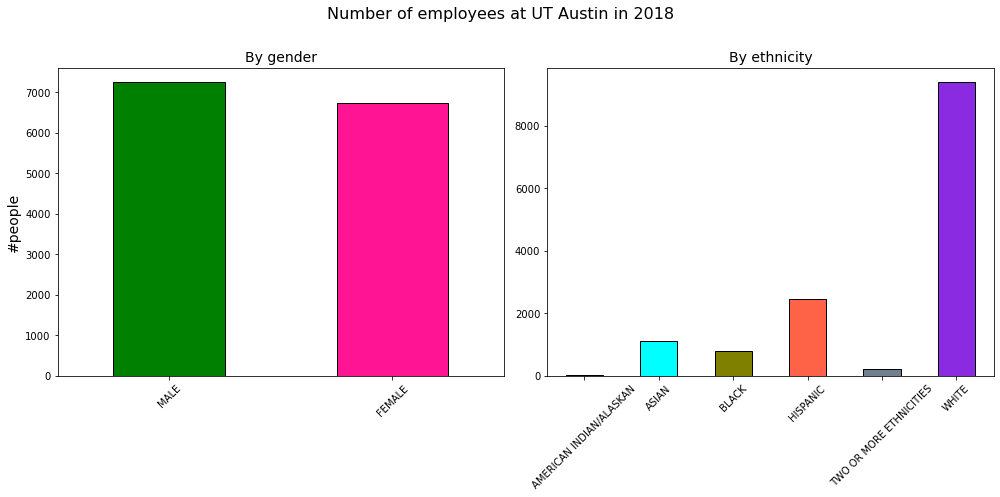

In [15]:
#general employment 
frequencies_emp_g = pd.value_counts(data["gender"])
frequencies_emp_g = frequencies_emp_g.reindex(order_gender, axis = 0)

frequencies_emp_r = pd.value_counts(data["race"])
frequencies_emp_r = frequencies_emp_r.reindex(order_race, axis = 0)


fig = plt.figure(figsize = (14,7))
fig.suptitle('Number of employees at UT Austin in 2018\n', size = 16)

plt.subplot(1,2,1)
frequencies_emp_g.plot(kind = "bar", color = color_gender, edgecolor = "black")
plt.ylabel("#people", size = 14)
plt.title("By gender", size = 14)
plt.xticks(rotation = 45)


plt.subplot(1,2,2)
frequencies_emp_r.plot(kind = "bar", color = color_race, edgecolor = "black")
plt.title("By ethnicity", size = 14)
plt.xticks(rotation = 45)

    
plt.tight_layout()

> The figure above shows the distribution of gender and race over the employees. We see that the gender distribution is pretty equal, whereas the white employees dominate in race group. 


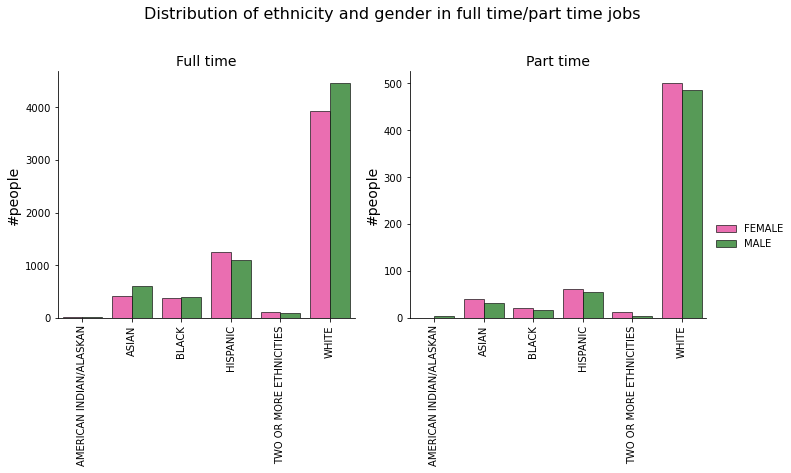

In [16]:
#distribution of ethnicity and gener in full time/part time jobs
temp_data = pd.DataFrame({'count' : data.groupby(["type","gender","race"]).size()}).reset_index()

n_by_type = temp_data.groupby("type").sum()["count"]

temp_data["count_norm"] = np.where(temp_data["type"] == "FULL TIME", temp_data["count"]/n_by_type[0], temp_data["count"]/n_by_type[1])

g = sns.FacetGrid(temp_data, col="type",sharey=False, height = 5, aspect = 1) # Col = panes, sharey, sharex (axis)
g.map(sns.barplot, "race", "count", "gender", alpha=.7, dodge = True,
     hue_order = sorted(data.gender.unique()),
     order = sorted(data.race.unique()),
     edgecolor=".1",
     palette = sns.color_palette(["deeppink","green"]))
g.add_legend()
g.set_xticklabels(rotation=90)
axes = g.axes.flatten()
axes[0].set_title("Full time", size = 14)
axes[0].set_xlabel("")
axes[1].set_title("Part time", size = 14)
axes[1].set_xlabel("")
axes[0].set_ylabel("#people", size = 14)
axes[1].set_ylabel("#people", size = 14)
g.fig.subplots_adjust(top=0.8) # adjust the Figure in rp
g.fig.suptitle("Distribution of ethnicity and gender in full time/part time jobs", size = 16)


plt.show()


> The figure above illustrates the distribution of full time and part time jobs ofr both gender and ethnicity groups. We clearly see that there is more white people working full time compared to the others.

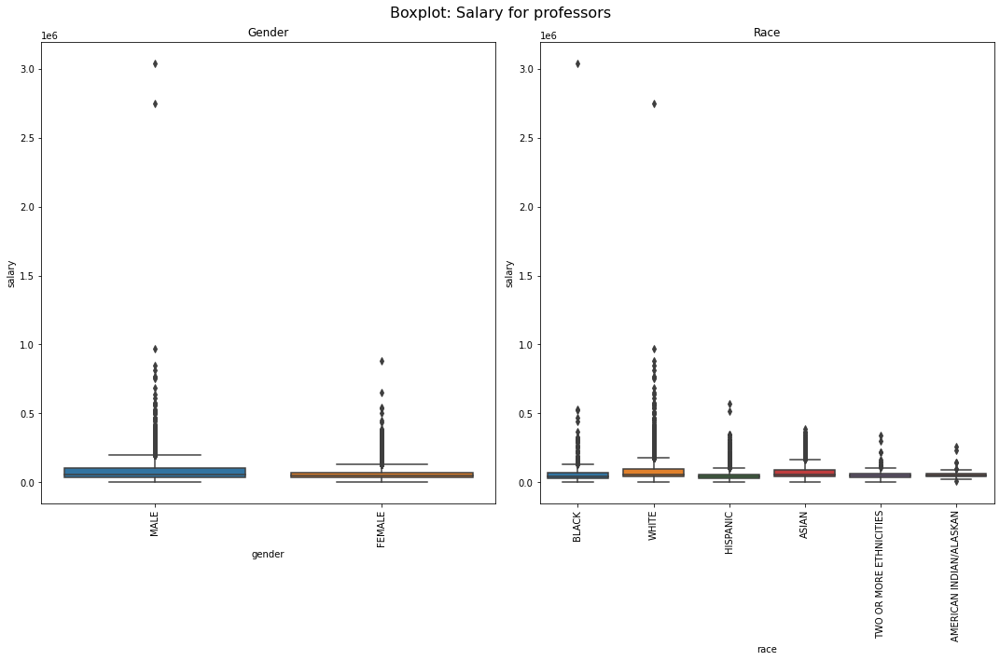

In [17]:
#boxplot for salaries (general)
fig = plt.figure(figsize = (15,10))
fig.suptitle('Boxplot: Salary for professors', size = 16)

plt.subplot(1,2,1)
sns.boxplot(x="gender", y="salary", data=data)
plt.xticks(rotation = 90)
plt.title("Gender")

plt.subplot(1,2,2)
sns.boxplot(x="race", y="salary", data=data)
plt.xticks(rotation = 90)
plt.title("Race")

plt.tight_layout()

> Inspired by the difference in means, we try to make box plots for the salary. It turns out to be a very bad vizualization and we can hardly get any usefull information out of it, beacuse of the outliers. We choose to instead divide the observations into 5 salary groups defined by the 5 quantiles (salary group 1 will be the 20% who are payed the most). 

## Data Analysis

### Overview

__SALARY GROUPS__

We split our observations into five salary groups to further investigate the salary distribution.

In [18]:
#We create 5 different salary stages
q20, q40, q60, q80 = np.quantile(data["salary"],[0.20, 0.40,0.60,0.80])

In [19]:
#asssigning salary groups
data["salary_group"] = " "

for i in data.index:
    obs = data["salary"][i]
    if obs < q20: 
        data["salary_group"][i] = 5
    elif obs < q40:
        data["salary_group"][i] = 4
    elif obs < q60:
        data["salary_group"][i] = 3
    elif obs < q80:
        data["salary_group"][i] = 2
    else: 
        data["salary_group"][i] = 1

C:\Users\johan\AppData\Local\Temp/ipykernel_51536/470774881.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["salary_group"][i] = 1
C:\Users\johan\AppData\Local\Temp/ipykernel_51536/470774881.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["salary_group"][i] = 2
C:\Users\johan\AppData\Local\Temp/ipykernel_51536/470774881.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["salary_group"][i] = 3
C:\Users\johan\A

In [20]:
#salary group intervals
for i in range(1,6): 
    temp_salary = data.loc[data["salary_group"] == i]
    print("Salary group", i, "has a yearly income between", np.min(temp_salary["salary"]), "and", np.max(temp_salary["salary"]))

Salary group 1 has a yearly income between 97863 and 3040417
Salary group 2 has a yearly income between 63381 and 97860
Salary group 3 has a yearly income between 47000 and 63379
Salary group 4 has a yearly income between 33091 and 46998
Salary group 5 has a yearly income between 1000 and 33081


C:\Users\johan\AppData\Local\Temp/ipykernel_51536/50280308.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_data["salary_group"][i] = str(temp_data["salary_group"][i])


(0.0, 350000.0)

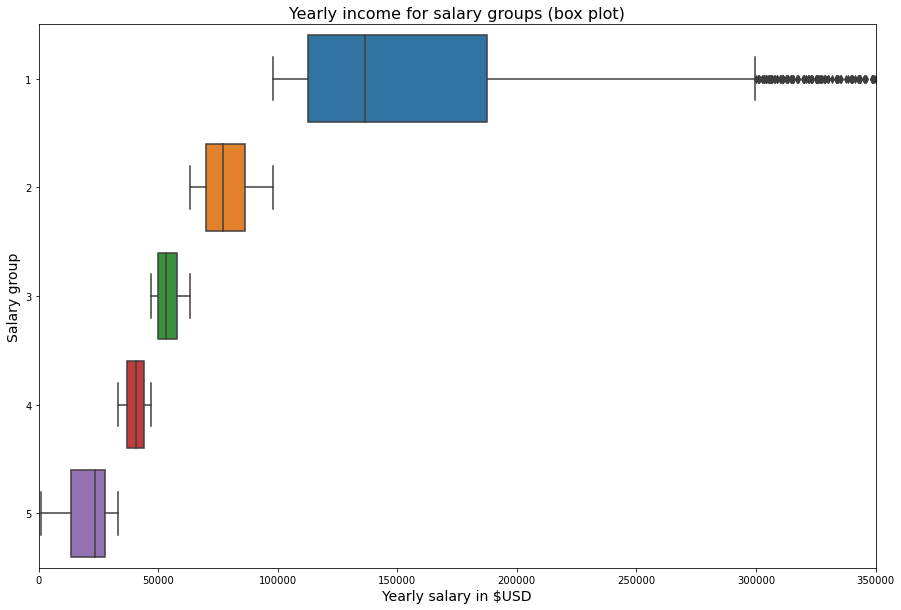

In [21]:
#boxplot for salary in salary groups
fig = plt.figure(figsize = (15,10))
#sns.boxplot(x="salary", y="salary_group",
                 #data=temp_job, palette="Set3")
    
temp_data = data.copy()

for i in temp_data.index: 
    temp_data["salary_group"][i] = str(temp_data["salary_group"][i])

#temp_data["salary_group"] = str(temp_data["salary_group"])

sns.boxplot(x="salary", y="salary_group", data=temp_data)
plt.xlabel("Yearly salary in $USD", size = 14)
plt.ylabel("Salary group", size = 14)
plt.title("Yearly income for salary groups (box plot)", size = 16)
plt.xlim([0,350000])

> The figure shows, that salary group 1 by far is the salary group with highest variance, i.e. has the greatest difference in what people get paid. Group 1 is also the only group with outliers. Group 5 has a mean that is slightly skewed to the right, meaning that the lower quantile has greater variance than the higher quantile.

__10 most frequent jobs__

Since there is 744 jobs will we not be able to look at them all, we therefore decide only to look at the 10 most frequent jobs.

In [22]:
#the ten most frequent jobs
jobs = data.groupby("job").size().sort_values(ascending = False)[0:10].index
order_job = sorted(jobs)

#temporary data
temp_job = data[data["job"].isin(jobs)]
temp_full = temp_job[temp_job["type"] == "FULL TIME"]
temp_part = temp_job[temp_job["type"] == "PART TIME"]

frequencies_job = pd.value_counts(temp_job["job"])
frequencies_job = frequencies_job.reindex(order_job, axis = 0)
frequencies_full = pd.value_counts(temp_full["job"])
frequencies_full = frequencies_full.reindex(order_job, axis = 0)
frequencies_part = pd.value_counts(temp_part["job"])
frequencies_part = frequencies_part.reindex(order_job, axis = 0)

print("The focus jobs account for", sum(frequencies_job)/data.shape[0]*100, "% of the total number of employees.")

The focus jobs account for 33.007003001286265 % of the total number of employees.


> This is good, as we actually cover quite a big part of the data set by just looking at these 10 jobtypes.

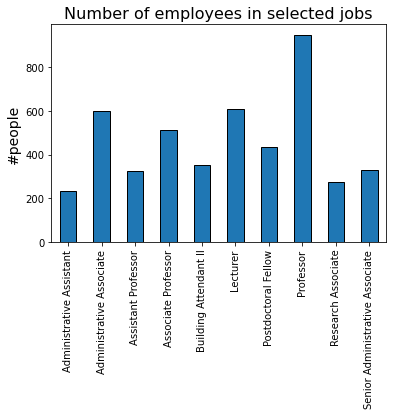

In [23]:
#number of employees in each focus job
#fig = plt.figure(figsize = (14,7))
frequencies_job.plot(kind = "bar", edgecolor = "black")
plt.title("Number of employees in selected jobs", size = 16)
plt.ylabel("#people", size = 14)
plt.xticks(rotation = 90);

> From the figure above is it clear that the moste frequent jobtitle is professor with over 800 employees and then we have Lecturer and Administrative Associate both with around 600 employees. If we take a closer look at the job titles the only one there stands out from the others is the Building Attendant II, which is a administrative job where the others are academic.   We might here see a large difference in salary as the academinc job possibly has a higher pay rate.

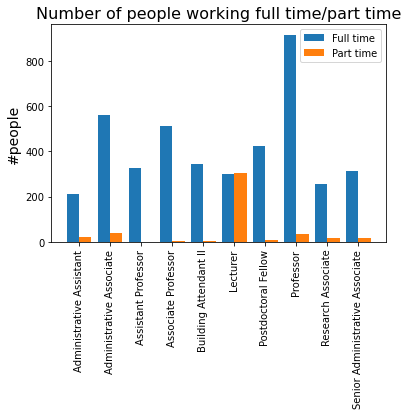

In [24]:
#number of employees in each job (part time/full time)
X_axis = np.arange(len(order_job))
  
plt.bar(X_axis - 0.2, frequencies_full, 0.4, label = 'Full time')
plt.bar(X_axis + 0.2, frequencies_part, 0.4, label = 'Part time')
  
plt.xticks(X_axis, order_job, rotation = 90)
plt.xlabel("")
plt.ylabel("#people", size = 14)
plt.title("Number of people working full time/part time", size =16)
plt.legend()
plt.show()

> We then investigate the number of pepole there work full time and how many there work part time in the 10 jobs. For most employees is these jobs are they working full time, however for lecturer is it 50/50. This is illustrated in the figure above. 

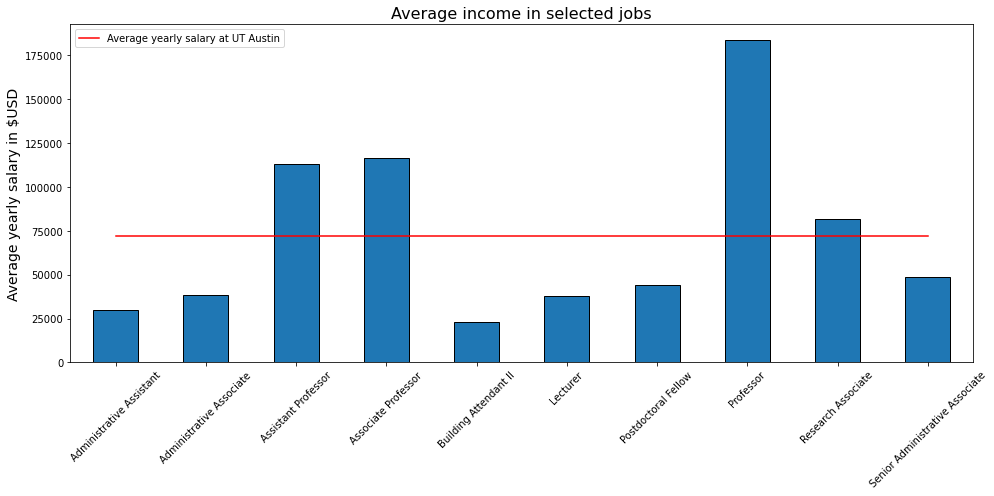

In [25]:
#mean income in focus jobs
salary_job = temp_job.groupby("job")["salary"].mean()
salary_mean = salary_job.copy()
for i in jobs: 
    salary_mean[i] = np.mean(data["salary"])

fig = plt.figure(figsize = (14,7))

salary_mean.plot(kind = "line", color = "red", xlabel = "", label = "Average yearly salary at UT Austin", legend = True)
salary_job.plot(kind = "bar", xlabel = "", edgecolor = "black")
plt.ylabel("Average yearly salary in $USD", size = 14)
plt.title("Average income in selected jobs", size = 16)
plt.xticks(rotation = 45)

plt.tight_layout()

> The average yearly salary at UT Austin is 72184.50 dollars which is indicated whit the red line. 4 of the 10 jobs have a yearly salary over the average. The 6 other jobtitles are all or jusrt about 50000 dollars and ss expected earlyer has bulding attendant II the lowest yearly salary compared to the rest.

## Boxplot, ANOVA and pair-wise t-test
In this section we investigate boxplot to create our hypothesis about gender and racial discrimination in slary

### Gender

We investigate if the distribution of male and female are any different for the different salary groups.

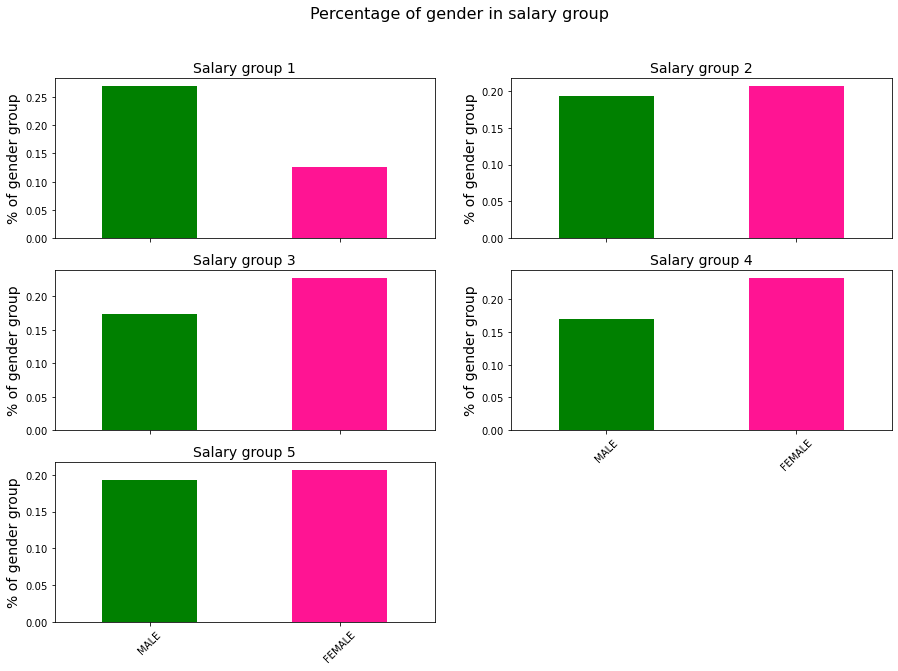

In [26]:
#ratio in salary group
plt.figure(figsize = (15,10))
plt.suptitle('Percentage of gender in salary group', size = 16)

for i in range(1,6): 
    plt.subplot(3,2,i)
    temp_race = data[data["salary_group"] == i].groupby("gender").size()
    temp_race_frac = temp_race/data.groupby("gender").size()
    temp_race_frac = temp_race_frac.reindex(order_gender, axis = 0)
    temp_race_frac.plot(kind = "bar", xlabel = "", color = color_gender)
    plt.ylabel("% of gender group", size = 14)
    plt.title("Salary group "+str(i), size = 14)
    
    if(i < 4):
        plt.tick_params(labelbottom = False)
    plt.xticks(rotation =45)
        
#plt.tight_layout()

> Men are over-represented by high-salary group, while women are severely under-represented. For salary group 2 the gender distribution is equal. For the remaining salary groups of lower-paid hobs, females are over-represented.

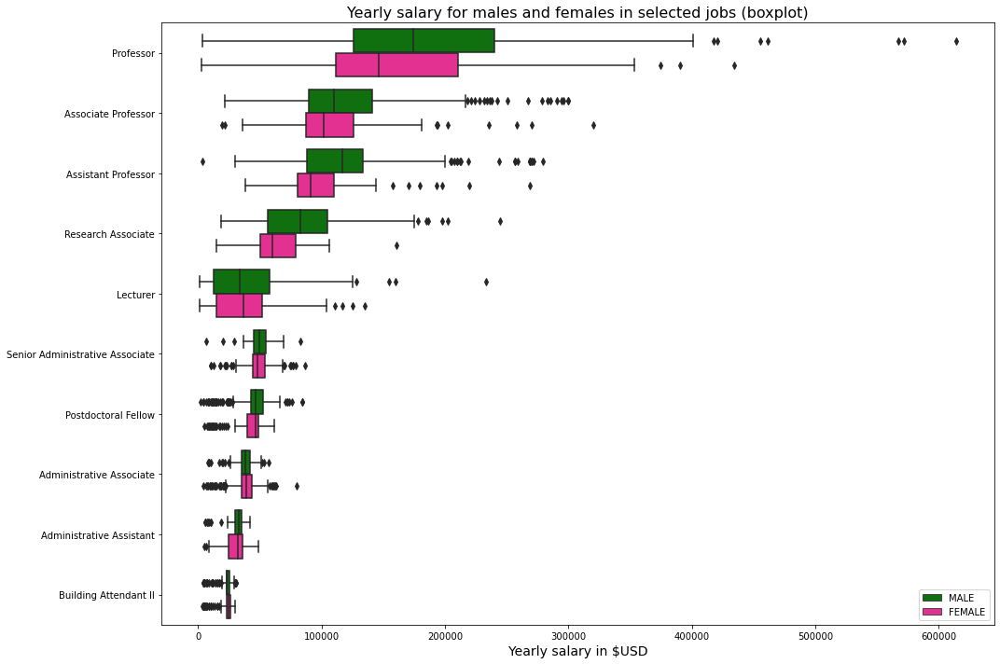

In [27]:
#boxplot
#figure
pal_gender = {"MALE":"green", "FEMALE":"deeppink"}
fig = plt.figure(figsize = (15,10))
plt.title("Yearly salary for males and females in selected jobs (boxplot)", size = 16)

sns.boxplot(x="salary", y="job", hue="gender",
                 data=temp_job, palette=pal_gender)
plt.xlabel("Yearly salary in $USD", size = 14)
plt.ylabel("")
plt.legend()
plt.tight_layout()

> Boxplot shows difference in salary between men and women. This is our hypethesis. ANOVA analysis has been carried out in R-studio (check R file); this is actually a three-way anova containing job, gender, and race aswell interactions. The test reveals on a 95% confidence level that gender , job, race and gender:job interaction is significant.

> We then perform a pairwise t-test between the jobs, to see where there is a difference in salary between men and women.

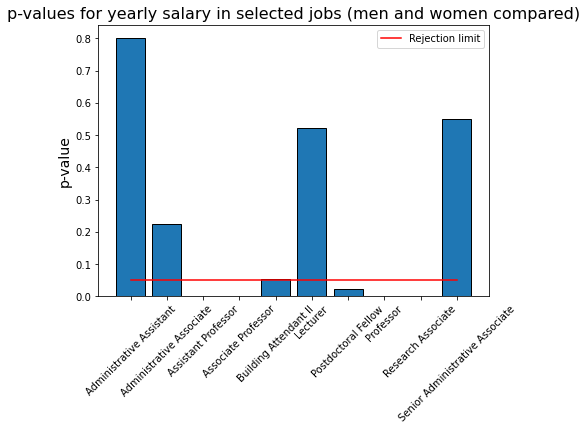

In [28]:
#are men and women paid the same in the same jobs?
pval_gender = []

for i in order_job: 
    test = data[data["job"] == i]
    test_male = test.loc[test["gender"] == "MALE"]
    test_female = test.loc[test["gender"] == "FEMALE"]
    
    test_stat, p_val =scipy.stats.ttest_ind(test_female["salary"],test_male["salary"])
    pval_gender.append(p_val)

#pvalues and limit
plt.figure(figsize = (7,5))
plt.title("p-values for yearly salary in selected jobs (men and women compared)", size = 16)

plt.plot(order_job, np.repeat(0.05, len(order_job)), color = "red", label = "Limit of rejection")
plt.legend(["Rejection limit"])
plt.bar(order_job, pval_gender, edgecolor = "black")

plt.ylabel("p-value", size = 14)
plt.xticks(rotation = 45);

> We see a salary differnce between men and women for Assistant Professor, Associate Professor, Postdoctoral Fellow, Professor, reseach professor, and if one allows a p-value to be a tiny bit greater than 0.05, then we also incluide Building Attendant.

> __OBS__ This is not included in the website, but a plot with the same meaning was made in R. The R code can be found in the Github repository where this code was also found.


### Ethnicity

We look into the distribution of ethnicity in the 10 jobs where there are most employees, which is the follwing jobs. 
Professor, Lecturer, Associate Professor, Administrative Associate, Senior Administrative Associate,Assistant Professor, Building Attendant II, Research Associate, Postdoctoral Fellow, Administrative Associate.

Distribution for the 10 jobs over the 7 etnicities

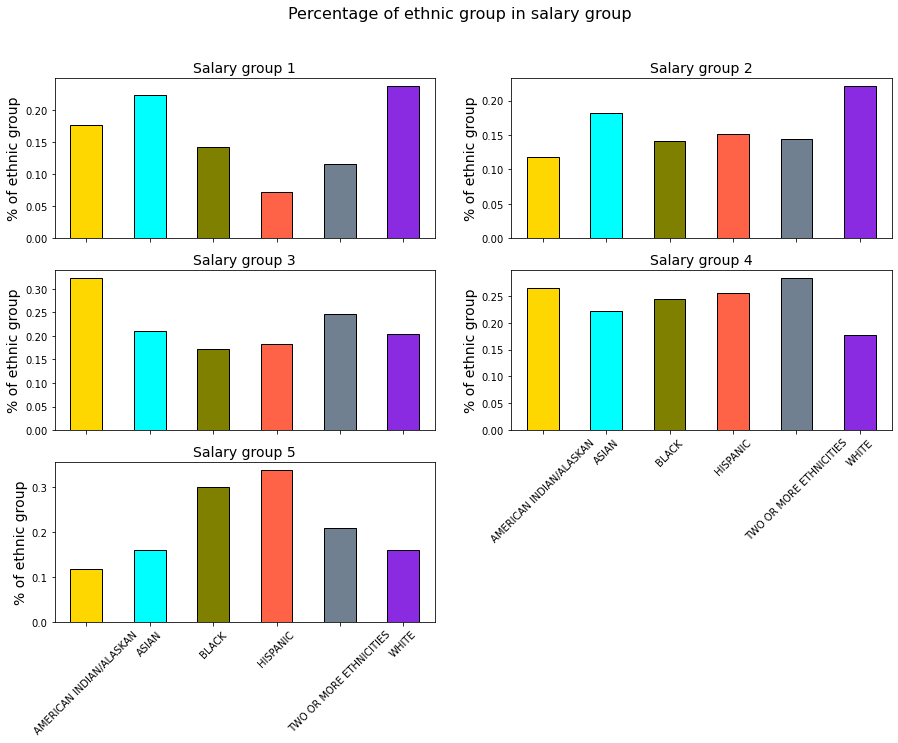

In [29]:
#ratio in salary group
plt.figure(figsize = (15,10))
plt.suptitle('Percentage of ethnic group in salary group', size = 16)

for i in range(1,6): 
    plt.subplot(3,2,i)
    temp_race = data[data["salary_group"] == i].groupby("race").size()
    temp_race_frac = temp_race/data.groupby("race").size()
    temp_race_frac.plot(kind = "bar", xlabel = "", color = color_race, edgecolor = "black")
    plt.ylabel("% of ethnic group", size = 14)
    plt.title("Salary group "+str(i), size = 14)
    
    if(i < 4):
        plt.tick_params(labelbottom = False)
        
    plt.xticks(rotation=45)
        
#plt.tight_layout()

> We definitely see that the salary groups have different racial distribution. And this is due to the fact that the racial distribution is different for high-paid job and low-paid job.

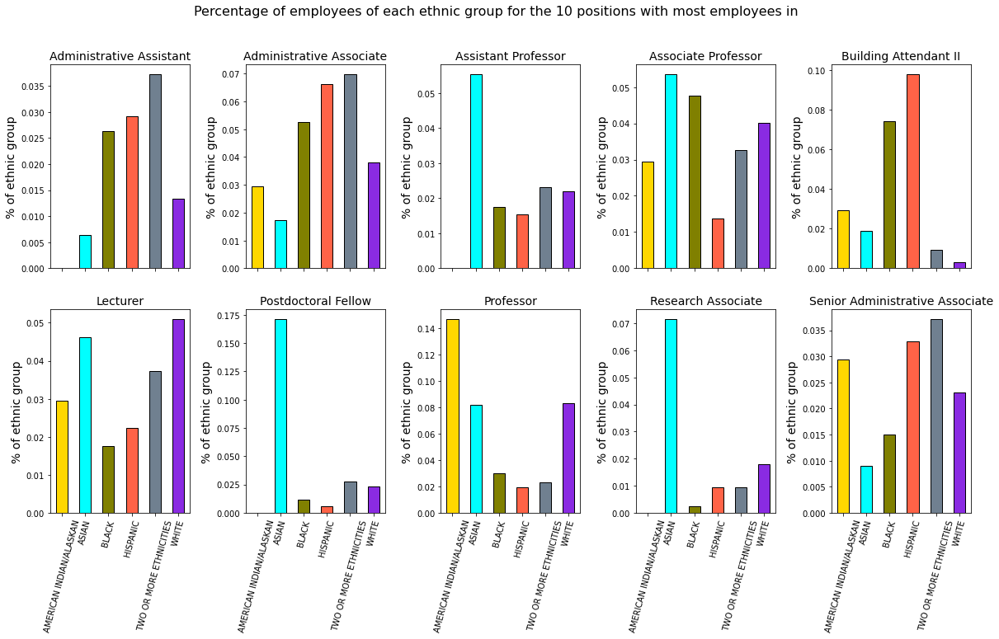

<Figure size 432x288 with 0 Axes>

In [30]:
#plot: race distributed in the 10 jobs
fig = plt.figure(figsize=(20,10))
fig.suptitle('Percentage of employees of each ethnic group for the 10 positions with most employees in\n', size = 16)

for i in range(1,11):
    plt.subplot(2,5, i)
    data_temp = data[data["job"] == order_job[i-1]].groupby("race").size()/data.groupby("race").size()
    data_temp = data_temp.reindex(order_race,fill_value=0).sort_index()
    data_temp.plot(kind = "bar", xlabel = "",
                   color = color_race, edgecolor = "black")
    plt.ylabel("% of ethnic group", size = 14)
    plt.title(order_job[i-1], size = 14)
    if (i<6):
        plt.tick_params(labelbottom=False)
    plt.xticks(rotation=75)
    
    
    # set the spacing between subplots
    plt.subplots_adjust(#left=0.1,
                        #bottom=0.1, 
                        #right=0.9, 
                        #top=1, 
                        wspace=0.4, 
                        #hspace=0.5
    )
plt.show()
plt.tight_layout()

> Whites and Asians dominate the best paid-jobs, while hispanics and black dominate low-paid jobs. This explains the difference in racial distribution for the different salary groups.

> We now dive deeper and investigate some boxplots.

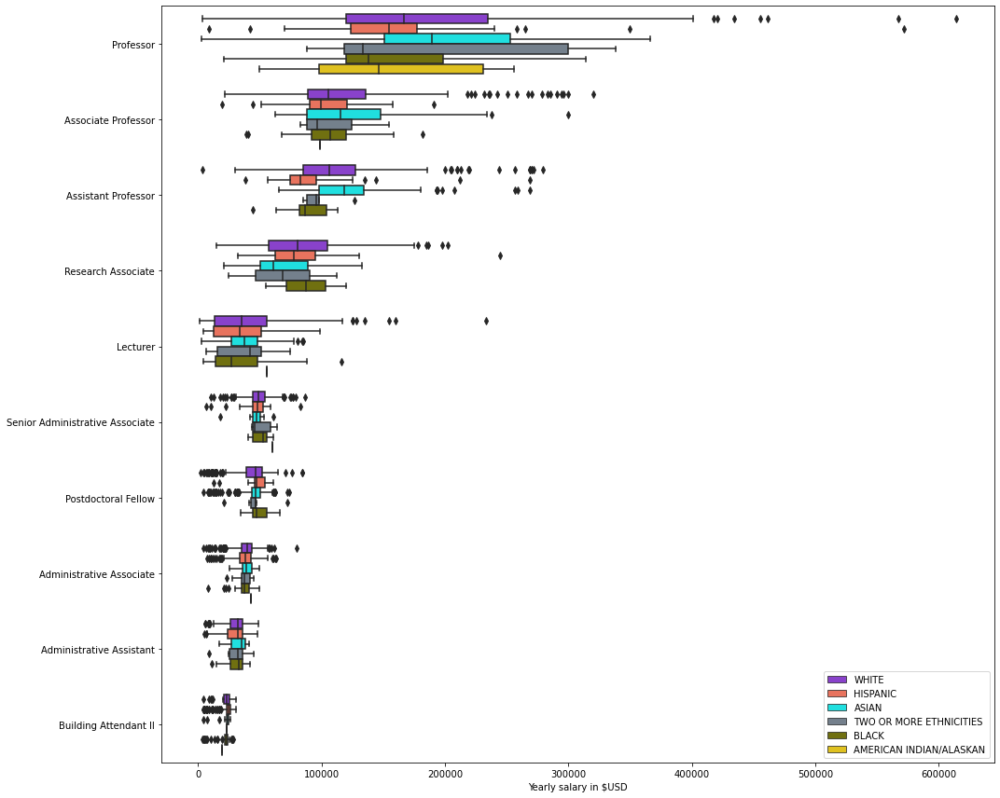

In [31]:
#boxplot
pal_race = {'AMERICAN INDIAN/ALASKAN': 'gold','ASIAN': 'aqua', 'BLACK': 'olive','HISPANIC':'tomato','TWO OR MORE ETHNICITIES': 'slategray',
 'WHITE': 'blueviolet'}
#my_pal = {"versicolor": "g", "setosa": "b", "virginica":"m"}



fig = plt.figure(figsize = (15,12))

sns.boxplot(x="salary", y="job", hue="race", palette = pal_race,
                 data=temp_job)
plt.ylabel("")
plt.xlabel("Yearly salary in $USD")
plt.legend()
plt.tight_layout()

> The boxplot definitely shows that there in a difference in salary between races for most of the jobs. The previous mentioned three-way ANOVA (check R file) also show this racial effect in salary.

> A pair-wise t-test comparison test is carried out (see webpage or R file)

### Location 

When looking at the geographical data we look at a smaller data set, since not every observation contians latitude, longitude and address. 

In [32]:
geo_data = raw_data[['job', 'dept', 'salary', 'hire_date', 'race', 'gender', 'type','address','latitude','longitude']]
#Removing nan
geo_data = geo_data.dropna()
#remove small race categories
keeprace = geo_data["race"].unique()[0:6]
geo_data = geo_data.loc[geo_data["race"].isin(keeprace)] 

In [33]:
# Removing unnecessary spaces
geo_data["job"] = geo_data["job"].str.strip()
geo_data["dept"] = geo_data["dept"].str.strip()
geo_data["race"] = geo_data["race"].str.strip()
geo_data["gender"] = geo_data["gender"].str.strip()
geo_data["type"] = geo_data["type"].str.strip()
geo_data["address"] = geo_data["address"].str.strip()

In [34]:
#Generating a datafame there only contains addresses in Texas
df = geo_data[geo_data['address'].str.contains('TX')]
#Removing race with out name
df = df[df.race != ""]
race = df.race.unique()

In [35]:
white = df.loc[df["race"]=='WHITE']
black = df.loc[df["race"]=='BLACK']
asian = df.loc[df["race"]=='ASIAN']
hispanic = df.loc[df["race"]=='HISPANIC']
amerindia = df.loc[df["race"]=='AMERICAN INDIAN/ALASKAN']
two_ethnicities = df.loc[df["race"]=='TWO OR MORE ETHNICITIES']

In [36]:
# Generating a new map over Austin Texas
map_TX_2 = folium.Map([30.30,-97.8],zoom_start=10.5,tiles = "Stamen Toner")

In [37]:
LAT = white["latitude"]
LON = white["longitude"]

for i in range(0,len(LON)):
    folium.CircleMarker([LAT.iloc[i], LON.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='red',
                    ).add_to(map_TX_2)
    
LAT_black = black["latitude"]
LON_black = black["longitude"]

for i in range(0,len(LON_black)):
    folium.CircleMarker([LAT_black.iloc[i], LON_black.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='blue',
                    ).add_to(map_TX_2)
LAT_asian = asian["latitude"]
LON_asian = asian["longitude"]

for i in range(0,len(LON_asian)):
    folium.CircleMarker([LAT_asian.iloc[i], LON_asian.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='black',
                    ).add_to(map_TX_2)

LAT_hispanic = hispanic["latitude"]
LON_hispanic = hispanic["longitude"]

for i in range(0,len(LON_hispanic)):
    folium.CircleMarker([LAT_hispanic.iloc[i], LON_hispanic.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='green',
                    ).add_to(map_TX_2)
LAT_amerindia = amerindia["latitude"]
LON_amerindia = amerindia["longitude"]

for i in range(0,len(LON_amerindia)):
    folium.CircleMarker([LAT_amerindia.iloc[i], LON_amerindia.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='yellow',
                    ).add_to(map_TX_2)

LAT_two_ethnicities = two_ethnicities["latitude"]
LON_two_ethnicities = two_ethnicities["longitude"]

for i in range(0,len(LON_two_ethnicities)):
    folium.CircleMarker([LAT_two_ethnicities.iloc[i], LON_two_ethnicities.iloc[i]],
                    radius=1,
                    popup='austin',
                    color='pink',
                    ).add_to(map_TX_2)
    
folium.Marker([30.285066716146726, -97.73401378718398],
              popup='University of Texas at Austin',
              icon=folium.Icon(color='red',icon="fa-university", prefix='fa')
              ).add_to(map_TX_2)

In [38]:
#Visulaizing the map
map_TX_2

> The map above shows the Austin area around the university where the dots indicates where the employeers work. The colors red, blue, green, yellow, pink and black indicates respectively the ethnic groups white, black, hispanic, american inidan/alaskan, Two or more ethnicities, asian. There are no clrear indicater that there are a differenc in where people live based on the ethnic group they belongs to. However we can see that among the few there lives near Lake Travis, The Hills and Dripping Springs (to the left in the map) are mostly people in the ethnic group white.

We want to investegate if there is a connection between the salary people have and the location they live in. We are deviding the employees into 5 different salary groups.

In [39]:
#asssigning salary groups
geo_data["salary_group"] = " "

for i in geo_data.index:
    obs = geo_data["salary"][i]
    if obs < q20: 
        geo_data["salary_group"][i] = 5
    elif obs < q40:
        geo_data["salary_group"][i] = 4
    elif obs < q60:
        geo_data["salary_group"][i] = 3
    elif obs < q80:
        geo_data["salary_group"][i] = 2
    else: 
        geo_data["salary_group"][i] = 1

C:\Users\johan\AppData\Local\Temp/ipykernel_51536/474120129.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_data["salary_group"][i] = 1
C:\Users\johan\AppData\Local\Temp/ipykernel_51536/474120129.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_data["salary_group"][i] = 2
C:\Users\johan\AppData\Local\Temp/ipykernel_51536/474120129.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_data["salary_group"][i] = 3
C:\U

In [40]:
#Generating a new map
map_salary_UTA = folium.Map([31.4,-99.377],zoom_start=5.5,tiles = "Stamen Toner")

In [41]:
df_sal = geo_data[geo_data['address'].str.contains('TX')]
salary_group = df_sal.salary_group.unique()
heat_data = [[[row['latitude'],row['longitude'],0.2] for index, row in df_sal[df_sal['salary_group'] == salary_group[i]].iterrows()] for i in range(0,len(salary_group))]

hm = plugins.HeatMapWithTime(heat_data, gradient={1: 'blue',1:'lime',1:'orange',1:'red'}, auto_play=True, max_opacity = 1)
hm.add_to(map_salary_UTA)
folium.Marker([30.285066716146726, -97.73401378718398],
              popup='University of Texas at Austin',
              icon=folium.Icon(color='red',icon="fa-university", prefix='fa')
              ).add_to(map_salary_UTA)
map_salary_UTA

> The heat map indicates the employees divided in to the 5 salary groups. In all 5 groups is it clear that most of the people lives close to the big citys. However, when we play the animation it seems that as the salary group number get higher the there are more people living outside the cityes. When comparing the the first salary group with the 4. and 5. we can clearly see the difference.

### Connection between distance to the unitversity and salery

__Jitter plot__

This jitter plot gives an idead of spatial distribution of workers with respect to the university.

In [42]:
#se her: #https://stackoverflow.com/questions/19412462/getting-distance-between-two-points-based-on-latitude-longitude
import geopy.distance
geo_data = geo_data[geo_data['address'].str.contains('TX')]

geo_data["distance"] = " "

coords_uni = (30.266666, -97.733330) #university

for i in geo_data.index: 
    coords_home = (geo_data["latitude"][i], geo_data["longitude"][i])
    geo_data["distance"][i] = geopy.distance.distance(coords_uni, coords_home).km

C:\Users\johan\AppData\Local\Temp/ipykernel_51536/4075320936.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_data["distance"][i] = geopy.distance.distance(coords_uni, coords_home).km


In [43]:
#mean distance of salary groups
for i in range(1,6): 
    temp = geo_data.loc[geo_data["salary_group"] == i]
    print("The mean distance in salary group", i)
    print(np.mean(temp["distance"]))

The mean distance in salary group 1
27.56020891396457
The mean distance in salary group 2
37.27141097443904
The mean distance in salary group 3
46.12481365764395
The mean distance in salary group 4
63.66404796744617
The mean distance in salary group 5
61.89918080962394


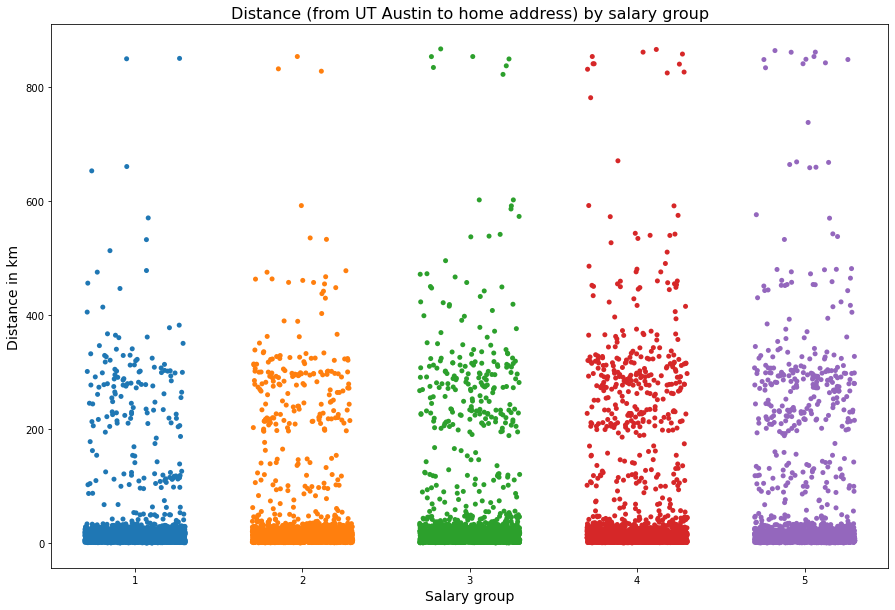

In [44]:
#jitter plot: distance uni-home in km (by salary group)
plt.figure(figsize = (15,10))
ax = sns.stripplot(x = "salary_group", y = "distance", jitter = 0.3, hue = "salary_group", data=geo_data)
ax.set_xlabel("Salary group", size = 14)
ax.set_ylabel("Distance in km", size = 14)
ax.set_title("Distance (from UT Austin to home address) by salary group", size = 16)
plt.legend([],[], frameon=False)

> High-income salary group generally live closer to the university, while lower-income salary group have higher density of people living far from the university.

## Genre 

__Which genre of data story did you use?__
>     On our website, we used a combination between the genres; slide show, magazine style and video animation in form of heat maps to tell our story.


__Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?__

> __(i) Visual structuring__: We have created the website that consists of slide shows divided into 5 categories: welcome/start page, overview, location, ethnicity and gender. Each category is set up magazine
styled containing various plots. The thought behind the visual structure
of the website is that the viewer independently can work their way though the website. 
The categories in the top of the website gives a great overview. In this categorie is the following tools ues: checklist prgress tracker.

>__(ii) Highlighting__: This category refers to the visual effects that help direct the viewer's attention
to a particular element. We use colors in the visualizations to make it easier for the viewer to
distinguish between genders and ethnicity groups. We work mostly with light
colors to draw the viewers attention to take a closer look at the visualization. Each visualization
is presented in a size so the information we want to pass on to the viewer is easily found. We use
motion/video in the heat maps under the location category, to visually engage the viewers.
In the categorie is the following tool used: motion, zooming, colors and size. 

> __(iii) Transition guidance__: The scrolling feature on websites create a nice continuous experience for the viewers.

__Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?__
> __(i) Ordering__: The path which the viewer should take, within the tabs of the webpage, is prescribed
by the author (*linear*). The viewer is recommended to read the welcome page and the overview section before
proceeding to any of the remaining categories which do not need to be read in a specific order.
We have chosen this to give the viewer some room to select its own path (*user directed path*).
In this category the following tools used: User directed path and linear.


>__(ii) Interactivity__: The viewer needs to interact, to move between the slide shows which is described
on the welcome page. On each page the user can use the navigation buttons, up and down on
the keyboard or use the mouse wheel to navigate. For the heat map animation under the location tab the viewer has
the choice to restart and regulate in the speed of the animation.
We have done this to make our webpage more engaing to readers.
In this category is the following tools used: navigation buttons and very limited interactivity.

>__(iii) Messaging__: Messaging refers to the ways a visualization communicates observations and com-
mentary to the viewer. Our visualizations have short text fields in the form of labels, captions
and headlines. Furthermore the figures have an introducing text to visualisation that summaries the
information it contains. This gives the user a better overview and understanding of what they are
looking at.
In this category is the following tools used: Captions/headlines, introductory text and sum-
mary/synthesis.

## Visualization 

__Explain the visualizations you've chosen.__

> We have focused created visualizations based on bar-plots, boxplot, spacial figures and heatmaps.

> BAR PLOTS: Bar plot are really good when we want to look at the distribution, in our case example over the
gender, ethnicity or the distribution of ethnicity’s in a job. With this visualisation is it easier
to see if there are any patters or links, which would be harder to identify in a table with data.
Furthermore is is a good visualization to use when wanting to present some data and it is easy
for the reader to relate to

> BOX PLOT: Boxplots provides a visual summary of the data where the mean and outliers are easy to identify.
This visualization is also good when we want to compare between different groups. Example when
we compare salary between gender or ethnicity’s

__Why are they right for the story you want to tell?__
> As mentioned earlier, are we investigating out from the data whether there is any inequalities in gender
or ethnicity’s at the university of Texas at Austin. The histograms/bar plots are useful to give a quick
overview of the data.
For further data analysis provides the boxplots an more detailed analysis than the bar plots and gives
us the opportunity to easier compare between groups and see possible differences.
The geographical data gives us the opportunity to illustrate where the people lives and to analyse if
there are any patterns between the salary group the are in or the ethnicity group they belong to

## Discussion

Overall, we think we looked widely at the data and got around it pretty well. We worked with all of the variables and looked at possible links for all of them with the ANOVA. And we actually found something! As disheartening as it was to see that in 2018, there was still a paygap based on ethnic group and gender, it was also pretty cool to actually find significant differences. 
We also think that we suceeded with presenting our results to an un-scientific reader on the website; we spend a lot of time on rewriting the website texts but found that the result was worth it, with a somehow engaging tone and easy explanation. We also used color schemes to make it even easier for the reader to navigate the plots.

For further work, we have a couple of thoughts.

First of all, we thought it would be interesting to compare the distribution of ethnic groups in Texas with the distribution at the university to see if it is representative. We would also like to take out the zip code from the observations. Based on this, we could compare the income of the employees with the average income in their zip codes and look into whether there is a difference in the neighbourhoods that people choose based on eg. ethnicity, gender or maybe salary group. 

It would also be interesting if we could actually narrow the job types and department types down. Without an insider, it seemed like an undoable job to group these together, but if it was possible to eg. classify people as "works in humaniora" or "works in science" or the like, we could maybe make some connections between who prefers to work were - and also see where the salaries differ in this way. 

We would also like to look into the distributions of other universities - in Texas, in the US, in the world! However, data sets with records of ethnicity is quite rare outside the US, so the last one might not be as relevant. The data might in general be hard to find right now, but the results of our analysis might be a wake up call and motivate governments (and universities) to make a similar list over their employees. 

Concerning the website, we would like to add a page with some kind of "calculator" that could tell you what you should get payed, independent of ethnic group and gender. Behind this calculator would of course be a model, preferably a machine learning one, which could make a good estimate of your expected salary based on eg. your education and what job, you were searching for. This model would of course have to be trained on unbiased data - i.e. not the UT Austin data set, where the data is biased because people are hired on a biased salary. We did make several models but did not include them here, because the biased data set deemed them irrelevant (and we could not find any data set to train such a model on).